In [598]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns

import collections

from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler
from sklearn.svm import LinearSVC
from sklearn.feature_selection import SelectFromModel, SelectKBest, chi2, RFE, VarianceThreshold
from sklearn.linear_model import LassoCV, LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

import torch
import torch.nn as nn
from torch.nn import functional as F
from torch.utils.data import DataLoader
from torch.nn import Linear, ReLU, Sigmoid
from torch.nn.init import kaiming_uniform_
from torch.nn.init import xavier_uniform_

import catalyst
from catalyst import dl, utils
from catalyst.dl.callbacks import EarlyStoppingCallback, CriterionCallback, MetricCallback, OptimizerCallback 
from catalyst.contrib.nn import OneCycleLRWithWarmup
from catalyst.contrib.callbacks.inference_callback import InferCallback
from catalyst.callbacks.metrics.f1_score import F1ScoreCallback
from catalyst.callbacks.metrics.accuracy import AccuracyCallback
from catalyst.callbacks.metrics.auc import AUCCallback
from catalyst.runners.supervised import SupervisedRunner
from torch.utils.data import TensorDataset


# Loading Dataset

In [453]:
df = pd.read_csv("/home/hasan/Desktop/Code to keep on Github/Cardiovascular Disease/cardio_train.csv", sep=';').drop('id', axis=1)
df.head()

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,17474,1,156,56.0,100,60,1,1,0,0,0,0


# Check missing values

In [454]:
df.isnull().sum()

age            0
gender         0
height         0
weight         0
ap_hi          0
ap_lo          0
cholesterol    0
gluc           0
smoke          0
alco           0
active         0
cardio         0
dtype: int64

yahaaaa! There are no missing data!

# Check duplicate values

In [455]:
df.duplicated().sum()

24

ohh no! there are 24 duplicate data. So what we are going to handle this

In [456]:
# Dropping duplicate values
df.drop_duplicates(inplace=True)
print("number of duplicated data after dropping :",df.duplicated().sum())

number of duplicated data after dropping : 0


oh wow! we removed duplicated data

# Data Describe

In [457]:
df.describe()

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
count,69976.000000,69976.000000,69976.000000,69976.000000,69976.000000,69976.000000,69976.000000,69976.000000,69976.000000,69976.000000,69976.000000,69976.000000
mean,19468.950126,1.349648,164.359152,74.208519,128.820453,96.636261,1.366997,1.226535,0.088159,0.053790,0.803718,0.499771
std,2467.374620,0.476862,8.211218,14.397211,154.037729,188.504581,0.680333,0.572353,0.283528,0.225604,0.397187,0.500004
min,10798.000000,1.000000,55.000000,10.000000,-150.000000,-70.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,17664.000000,1.000000,159.000000,65.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
50%,19703.000000,1.000000,165.000000,72.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
75%,21327.000000,2.000000,170.000000,82.000000,140.000000,90.000000,2.000000,1.000000,0.000000,0.000000,1.000000,1.000000
max,23713.000000,2.000000,250.000000,200.000000,16020.000000,11000.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000


It is clear that in ap_hi, ap_lo columns have outlier. Don't tension! Everything knows the God. 

# Outlier Checking and Dropping

In [458]:
std_list = ["age", "height", "weight", "ap_hi", "ap_lo"] 

def standartization(x):
    x_std = x.copy(deep=True)
    for column in std_list:
        x_std[column] = (x_std[column] - x_std[column].mean()) / x_std[column].std() 
    return x_std

df_std = standartization(df)
df_std.head()

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,-0.436071,2,0.443399,-0.847978,-0.122181,-0.088254,1,1,0,0,1,0
1,0.307635,1,-1.018016,0.749554,0.072577,-0.035205,3,1,0,0,1,1
2,-0.248017,1,0.078045,-0.709062,0.007658,-0.141303,3,1,0,0,0,1
3,-0.748143,2,0.565184,0.541180,0.137496,0.017844,1,1,0,0,1,1
4,-0.808532,1,-1.018016,-1.264725,-0.187100,-0.194352,1,1,0,0,0,0


In [459]:
# Melting data for multi box plot
df_melt = pd.melt(frame=df_std, id_vars='cardio', value_vars=std_list, var_name='features', value_name='value', col_level=None)
df_melt

,cardio,features,value
0,0,age,-0.436071
1,1,age,0.307635
2,1,age,-0.248017
3,1,age,-0.748143
4,0,age,-0.808532
...,...,...,...
349875,0,ap_lo,-0.088254
349876,1,ap_lo,-0.035205
349877,1,ap_lo,-0.035205
349878,1,ap_lo,-0.088254


(array([0, 1, 2, 3, 4]),
 [Text(0, 0, 'age'),
  Text(1, 0, 'height'),
  Text(2, 0, 'weight'),
  Text(3, 0, 'ap_hi'),
  Text(4, 0, 'ap_lo')])

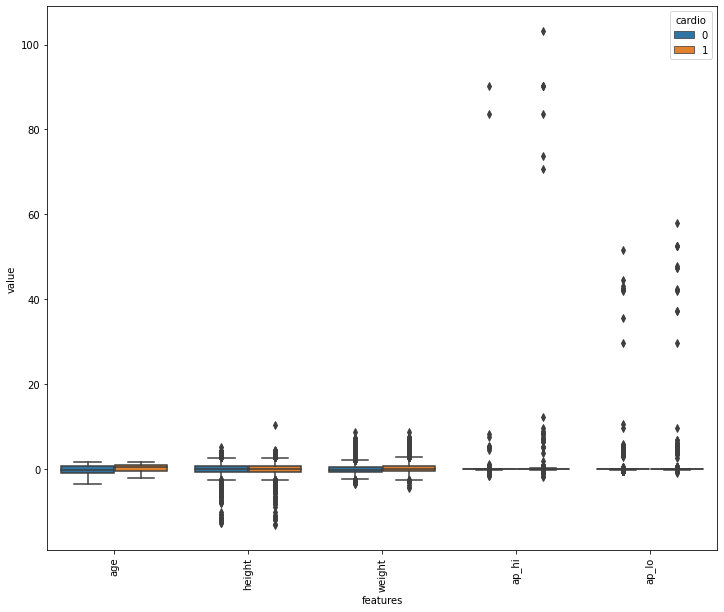

In [460]:
# Box plot
plt.figure(figsize=(12, 10))
sns.boxplot(x='features', y='value', hue='cardio', data=df_melt)
plt.xticks(rotation=90)

ap_hi and ap_lo have more outlier compared to age, height, weight. Let's handle it with the touch of finger. 

In [461]:
# Diciding upper and lower bound 
ap_list = ['ap_hi', 'ap_lo']
df_ap = pd.DataFrame(index=['lower_bound', 'upper_bound'])

for each in ap_list:
    Q1 = df[each].quantile(0.25)
    Q3 = df[each].quantile(0.75)
    IQR = Q3 - Q1
    
    lowr_bound = Q1 - 1.5*IQR
    upper_bound = Q3 + 1.5*IQR
    df_ap[each] = [lowr_bound, upper_bound]
    
df_ap.head()

,ap_hi,ap_lo
lower_bound,90.0,65.0
upper_bound,170.0,105.0


<AxesSubplot:xlabel='cardio', ylabel='count'>

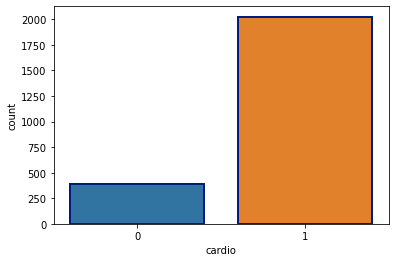

In [462]:
# Outlier rows
ap_hi_filter = (df['ap_hi'] > df_ap['ap_hi'][1])
ap_lo_filter = (df['ap_lo'] > df_ap['ap_lo'][1])
outlier_filter = (ap_hi_filter | ap_lo_filter)
df_outlier = df[outlier_filter]

# graph of outlier
sns.countplot(x='cardio', data=df_outlier, linewidth=2, edgecolor=sns.color_palette("dark", 1))

In [463]:
# taking less than 250 in ap_hi and less than 200 in ap_lo
outlier_filter = ((df["ap_hi"]>250) | (df["ap_lo"]>200) )
df = df[~outlier_filter]
df.shape

(68983, 12)

# Fixing age column

In [464]:
df['age'] = (df['age']/365).round().astype('int')
df.head()

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,50,2,168,62.0,110,80,1,1,0,0,1,0
1,55,1,156,85.0,140,90,3,1,0,0,1,1
2,52,1,165,64.0,130,70,3,1,0,0,0,1
3,48,2,169,82.0,150,100,1,1,0,0,1,1
4,48,1,156,56.0,100,60,1,1,0,0,0,0


# New column of body mass index

In [465]:
df['bmi'] = df['weight'] / (df['height']/100)**2
df.head()

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,bmi
0,50,2,168,62.0,110,80,1,1,0,0,1,0,21.967120
1,55,1,156,85.0,140,90,3,1,0,0,1,1,34.927679
2,52,1,165,64.0,130,70,3,1,0,0,0,1,23.507805
3,48,2,169,82.0,150,100,1,1,0,0,1,1,28.710479
4,48,1,156,56.0,100,60,1,1,0,0,0,0,23.011177


# Fixing gender column

In [466]:
df['gender'] = df['gender'].apply(lambda x: 0 if x==1 else 1)
df.head()

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,bmi
0,50,1,168,62.0,110,80,1,1,0,0,1,0,21.967120
1,55,0,156,85.0,140,90,3,1,0,0,1,1,34.927679
2,52,0,165,64.0,130,70,3,1,0,0,0,1,23.507805
3,48,1,169,82.0,150,100,1,1,0,0,1,1,28.710479
4,48,0,156,56.0,100,60,1,1,0,0,0,0,23.011177


# Feature Engineering

In [467]:
# Increasing the number of features
def feature_creation(df):
    df['age2'] = df['age']//10
    df['height2'] = df['height']//20 #10
    df['weight2'] = df['weight']//20
    df['ap_hi2'] = df['ap_hi']//20
    df['ap_lo2'] = df['ap_lo']//20
    df['bmi2'] = df['bmi']//10
    
    for i in ['gender', 'cholesterol', 'gluc', 'smoke', 'alco', 'active']:
        for j in ['age2', 'height2', 'weight2', 'ap_hi2', 'ap_hi2', 'bmi2']:
            df[i + "_" + j] = df[i].astype('str') + "_" + df[j].astype('str')
    return df


In [468]:
df = feature_creation(df)
df.head()

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,...,alco_age2,alco_height2,alco_weight2,alco_ap_hi2,alco_bmi2,active_age2,active_height2,active_weight2,active_ap_hi2,active_bmi2
0,50,1,168,62.0,110,80,1,1,0,0,...,0_5,0_8,0_3.0,0_5,0_2.0,1_5,1_8,1_3.0,1_5,1_2.0
1,55,0,156,85.0,140,90,3,1,0,0,...,0_5,0_7,0_4.0,0_7,0_3.0,1_5,1_7,1_4.0,1_7,1_3.0
2,52,0,165,64.0,130,70,3,1,0,0,...,0_5,0_8,0_3.0,0_6,0_2.0,0_5,0_8,0_3.0,0_6,0_2.0
3,48,1,169,82.0,150,100,1,1,0,0,...,0_4,0_8,0_4.0,0_7,0_2.0,1_4,1_8,1_4.0,1_7,1_2.0
4,48,0,156,56.0,100,60,1,1,0,0,...,0_4,0_7,0_2.0,0_5,0_2.0,0_4,0_7,0_2.0,0_5,0_2.0


In [469]:
# Categorical columns
cat_columns = []
numerics = ['int8', 'int16', 'int32', 'int64', 'float16', 'float32', 'float64']
columns = df.columns.values.tolist()

for col in columns:
    if df[col].dtype in numerics: continue
    cat_columns.append(col)
cat_columns

['gender_age2',
 'gender_height2',
 'gender_weight2',
 'gender_ap_hi2',
 'gender_bmi2',
 'cholesterol_age2',
 'cholesterol_height2',
 'cholesterol_weight2',
 'cholesterol_ap_hi2',
 'cholesterol_bmi2',
 'gluc_age2',
 'gluc_height2',
 'gluc_weight2',
 'gluc_ap_hi2',
 'gluc_bmi2',
 'smoke_age2',
 'smoke_height2',
 'smoke_weight2',
 'smoke_ap_hi2',
 'smoke_bmi2',
 'alco_age2',
 'alco_height2',
 'alco_weight2',
 'alco_ap_hi2',
 'alco_bmi2',
 'active_age2',
 'active_height2',
 'active_weight2',
 'active_ap_hi2',
 'active_bmi2']

In [470]:
# Encoding of categorical features
for col in cat_columns:
    if col in df.columns:
        le = LabelEncoder()
        le.fit(list(df[col].astype(str).values))
        df[col] = le.transform(list(df[col].astype(str).values))
df.head()        

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,...,alco_age2,alco_height2,alco_weight2,alco_ap_hi2,alco_bmi2,active_age2,active_height2,active_weight2,active_ap_hi2,active_bmi2
0,50,1,168,62.0,110,80,1,1,0,0,...,2,7,4,11,11,6,15,13,24,21
1,55,0,156,85.0,140,90,3,1,0,0,...,2,6,5,13,16,6,14,14,26,26
2,52,0,165,64.0,130,70,3,1,0,0,...,2,7,4,12,11,2,5,3,9,6
3,48,1,169,82.0,150,100,1,1,0,0,...,1,7,5,13,11,5,15,14,26,21
4,48,0,156,56.0,100,60,1,1,0,0,...,1,6,3,11,11,1,4,2,8,6


# Checking Balance Unbalance

<AxesSubplot:xlabel='cardio', ylabel='count'>

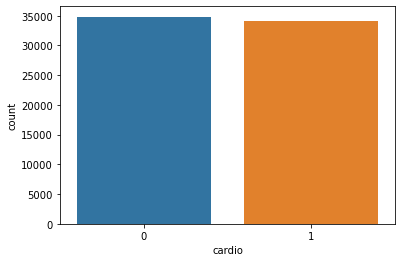

In [471]:
sns.countplot(x=df.cardio, data=df)

Woooow! this is the balance dataset!

# Feature and Label data

In [472]:
features = df.drop('cardio', axis=1)
label = df.cardio

# Features Selection

In [473]:
num_features_opt = 25
num_features_max = 35
features_best = []

In [474]:
threshold = 0.9

def highlight(value):
    if value > threshold:
        style = 'background-color: pink'
    else:
        style = 'background-color: palegreen'
    return style

# Absolute value correlation matrix
corr_matrix = df.corr().abs().round(2)
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
upper.style.format("{:.2f}").applymap(highlight)

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,bmi,age2,height2,weight2,ap_hi2,ap_lo2,bmi2,gender_age2,gender_height2,gender_weight2,gender_ap_hi2,gender_bmi2,cholesterol_age2,cholesterol_height2,cholesterol_weight2,cholesterol_ap_hi2,cholesterol_bmi2,gluc_age2,gluc_height2,gluc_weight2,gluc_ap_hi2,gluc_bmi2,smoke_age2,smoke_height2,smoke_weight2,smoke_ap_hi2,smoke_bmi2,alco_age2,alco_height2,alco_weight2,alco_ap_hi2,alco_bmi2,active_age2,active_height2,active_weight2,active_ap_hi2,active_bmi2
age,nan,0.02,0.08,0.06,0.20,0.15,0.16,0.10,0.05,0.03,0.01,0.24,0.09,0.92,0.07,0.05,0.19,0.14,0.07,0.30,0.03,0.01,0.00,0.00,0.37,0.15,0.16,0.17,0.17,0.36,0.09,0.10,0.12,0.12,0.46,0.06,0.03,0.01,0.00,0.56,0.05,0.01,0.04,0.04,0.37,0.02,0.00,0.02,0.02
gender,nan,nan,0.50,0.16,0.06,0.06,0.04,0.02,0.34,0.17,0.01,0.01,0.10,0.03,0.38,0.14,0.06,0.07,0.10,0.94,0.99,0.99,0.99,0.96,0.04,0.01,0.02,0.03,0.06,0.03,0.05,0.00,0.01,0.05,0.28,0.41,0.36,0.34,0.25,0.12,0.27,0.21,0.18,0.07,0.01,0.05,0.03,0.01,0.03
height,nan,nan,nan,0.29,0.02,0.04,0.05,0.02,0.19,0.09,0.01,0.01,0.29,0.08,0.82,0.27,0.03,0.05,0.28,0.44,0.57,0.52,0.49,0.44,0.07,0.05,0.02,0.05,0.08,0.04,0.13,0.02,0.01,0.07,0.12,0.37,0.25,0.19,0.09,0.02,0.33,0.18,0.10,0.03,0.04,0.10,0.04,0.00,0.06
weight,nan,nan,nan,nan,0.25,0.24,0.14,0.11,0.07,0.07,0.02,0.18,0.76,0.04,0.22,0.93,0.24,0.21,0.68,0.16,0.18,0.29,0.18,0.34,0.14,0.16,0.25,0.16,0.30,0.11,0.14,0.24,0.14,0.35,0.08,0.12,0.32,0.13,0.39,0.08,0.13,0.38,0.14,0.50,0.00,0.01,0.16,0.01,0.23
ap_hi,nan,nan,nan,nan,nan,0.64,0.18,0.09,0.03,0.03,0.00,0.40,0.22,0.18,0.01,0.24,0.97,0.53,0.19,0.12,0.05,0.09,0.18,0.11,0.22,0.18,0.21,0.28,0.22,0.13,0.08,0.12,0.22,0.16,0.12,0.03,0.09,0.28,0.13,0.14,0.03,0.11,0.34,0.16,0.07,0.00,0.05,0.13,0.07
ap_lo,nan,nan,nan,nan,nan,nan,0.16,0.08,0.02,0.04,0.00,0.33,0.20,0.13,0.02,0.23,0.63,0.89,0.18,0.11,0.06,0.10,0.14,0.12,0.18,0.15,0.18,0.21,0.19,0.11,0.08,0.11,0.16,0.14,0.09,0.03,0.09,0.18,0.12,0.12,0.05,0.12,0.23,0.16,0.05,0.00,0.04,0.08,0.07
cholesterol,nan,nan,nan,nan,nan,nan,nan,0.45,0.01,0.04,0.01,0.22,0.14,0.14,0.05,0.13,0.16,0.12,0.13,0.02,0.04,0.02,0.02,0.00,0.97,0.99,0.99,0.99,0.96,0.46,0.44,0.46,0.46,0.44,0.09,0.00,0.05,0.05,0.07,0.12,0.02,0.08,0.09,0.11,0.07,0.00,0.03,0.03,0.06
gluc,nan,nan,nan,nan,nan,nan,nan,nan,0.01,0.01,0.01,0.09,0.10,0.09,0.02,0.10,0.08,0.06,0.09,0.01,0.02,0.00,0.01,0.00,0.44,0.46,0.45,0.45,0.43,0.96,0.98,0.99,0.99,0.91,0.04,0.01,0.02,0.01,0.04,0.06,0.00,0.04,0.03,0.07,0.03,0.01,0.01,0.00,0.03
smoke,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.34,0.03,0.02,0.03,0.05,0.14,0.06,0.02,0.02,0.03,0.30,0.34,0.34,0.34,0.32,0.00,0.02,0.02,0.01,0.00,0.02,0.02,0.00,0.00,0.02,0.84,0.97,0.96,0.95,0.86,0.24,0.36,0.33,0.32,0.24,0.00,0.04,0.04,0.03,0.01
alco,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,0.03,0.01,0.01,0.03,0.07,0.06,0.02,0.03,0.01,0.15,0.17,0.17,0.17,0.17,0.03,0.04,0.04,0.04,0.04,0.00,0.02,0.02,0.01,0.01,0.28,0.33,0.34,0.33,0.30,0.78,0.95,0.94,0.93,0.75,0.01,0.03,0.04,0.03,0.03


In [475]:
# Select columns with correlations above threshold
collinear_features = [column for column in upper.columns if any(upper[column] > threshold)]
features_filtered = df.drop(columns = collinear_features)
print('The number of features that passed the collinearity threshold: ', features_filtered.shape[1])
features_best.append(features_filtered.columns.tolist())

The number of features that passed the collinearity threshold:  18


### Feature Selection by the SelectFromModel with LinearSVC

In [476]:
lsvc = LinearSVC(C=0.1, penalty="l1", dual=False).fit(features, label)
model = SelectFromModel(lsvc, prefit=True)
X_new = model.transform(features)
X_selected_df = pd.DataFrame(X_new, columns=[features.columns[i] for i in range(len(features.columns)) if model.get_support()[i]])
features_best.append(X_selected_df.columns.tolist())

/home/hasan/anaconda3/lib/python3.8/site-packages/sklearn/svm/_base.py:976: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



### Feature Selection by the SelectFromModel with Lasso

In [477]:
lasso = LassoCV(cv=3).fit(features, label)
model = SelectFromModel(lasso, prefit=True)
X_new = model.transform(features)
X_selected_df = pd.DataFrame(X_new, columns=[features.columns[i] for i in range(len(features.columns)) if model.get_support()[i]])
features_best.append(X_selected_df.columns.tolist())

### Feature Selection by the SelectKBest with Chi-2

In [478]:
# Standardizing feature data. Because SelectKBest don't take negative number 
# Data Normalize
scaler = MinMaxScaler()
normalized_features = scaler.fit_transform(features)

# Data Standardize
std = StandardScaler()
standardized_features = scaler.fit_transform(normalized_features)


In [479]:
bestfeatures = SelectKBest(score_func=chi2, k='all')
fit = bestfeatures.fit(standardized_features, label)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(features.columns)

#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns, dfscores],axis=1)
featureScores.columns = ['Feature','Score']  #naming the dataframe columns
features_best.append(featureScores.nlargest(num_features_max,'Score')['Feature'].tolist())
print(featureScores.nlargest(len(dfcolumns),'Score'))

                Feature        Score
6           cholesterol  2136.186973
23     cholesterol_age2  1041.919240
25  cholesterol_weight2   718.508457
26   cholesterol_ap_hi2   511.450943
27     cholesterol_bmi2   453.842181
7                  gluc   401.984555
24  cholesterol_height2   317.517699
28            gluc_age2   279.829533
12                 age2   271.176763
0                   age   221.761322
30         gluc_weight2   137.257942
32            gluc_bmi2   106.509344
31          gluc_ap_hi2   102.588948
38            alco_age2    94.826888
18          gender_age2    81.073089
33           smoke_age2    75.886631
3                weight    38.418327
14              weight2    35.711970
4                 ap_hi    32.348224
42            alco_bmi2    31.812048
15               ap_hi2    29.954418
21        gender_ap_hi2    25.259519
29         gluc_height2    23.026252
22          gender_bmi2    21.400052
41          alco_ap_hi2    20.743973
10               active    18.855791
5

### Feature Selection by the Recursive Feature Elimination (RFE) with Logistic Regression

In [480]:
rfe_selector = RFE(estimator=LogisticRegression(), n_features_to_select=num_features_max, step=10, verbose=5)
rfe_selector.fit(features, label)
rfe_support = rfe_selector.get_support()
rfe_feature = features.loc[:,rfe_support].columns.tolist()
print(str(len(rfe_feature)), 'selected features')

Fitting estimator with 48 features.


/home/hasan/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



Fitting estimator with 38 features.


/home/hasan/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/home/hasan/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



35 selected features


In [481]:
features_best.append(rfe_feature)

### Feature Selection by the Recursive Feature Elimination (RFE) with Random Forest

In [482]:
embeded_rf_selector = SelectFromModel(RandomForestClassifier(n_estimators=200), threshold='1.25*median')
embeded_rf_selector.fit(features, label)

SelectFromModel(estimator=RandomForestClassifier(n_estimators=200),
                threshold='1.25*median')

In [483]:
embeded_rf_support = embeded_rf_selector.get_support()
embeded_rf_feature = features.loc[:,embeded_rf_support].columns.tolist()
print(str(len(embeded_rf_feature)), 'selected features')

19 selected features


In [484]:
features_best.append(embeded_rf_feature)

### Feature Selection by the VarianceThreshold

In [485]:
# Check whether all features have a sufficiently different meaning
selector = VarianceThreshold(threshold=10)
np.shape(selector.fit_transform(df))
features_best.append(list(np.array(df.columns)[selector.get_support(indices=False)]))

### All Selected Features

In [486]:
features_best

[['age',
  'gender',
  'height',
  'weight',
  'ap_hi',
  'ap_lo',
  'cholesterol',
  'gluc',
  'smoke',
  'alco',
  'active',
  'cardio',
  'bmi',
  'height2',
  'ap_lo2',
  'smoke_age2',
  'alco_age2',
  'alco_bmi2'],
 ['age',
  'height',
  'weight',
  'ap_hi',
  'ap_lo',
  'cholesterol',
  'gluc',
  'smoke',
  'alco',
  'bmi',
  'age2',
  'height2',
  'weight2',
  'ap_hi2',
  'ap_lo2',
  'bmi2',
  'gender_age2',
  'gender_height2',
  'gender_weight2',
  'gender_ap_hi2',
  'gender_bmi2',
  'cholesterol_age2',
  'cholesterol_height2',
  'cholesterol_weight2',
  'cholesterol_ap_hi2',
  'cholesterol_bmi2',
  'gluc_age2',
  'gluc_height2',
  'gluc_weight2',
  'gluc_ap_hi2',
  'gluc_bmi2',
  'smoke_age2',
  'smoke_height2',
  'smoke_weight2',
  'smoke_ap_hi2',
  'smoke_bmi2',
  'alco_age2',
  'alco_height2',
  'alco_weight2',
  'alco_ap_hi2',
  'alco_bmi2',
  'active_age2',
  'active_height2',
  'active_weight2',
  'active_ap_hi2',
  'active_bmi2'],
 ['age',
  'height',
  'weight',
  'ap_

In [487]:
# The element is in at least one list of optimal features
main_cols_max = features_best[0]
for i in range(len(features_best)-1):
    main_cols_max = list(set(main_cols_max) | set(features_best[i+1]))
print("Filtered features :\n", main_cols_max)
len(main_cols_max)

Filtered features :
 ['cholesterol_ap_hi2', 'height', 'ap_hi2', 'gender_bmi2', 'alco_age2', 'ap_hi', 'age', 'gluc_weight2', 'active_bmi2', 'smoke', 'bmi', 'smoke_height2', 'smoke_bmi2', 'cardio', 'gender_ap_hi2', 'ap_lo2', 'height2', 'age2', 'active_height2', 'active_weight2', 'alco_bmi2', 'bmi2', 'gluc_age2', 'smoke_age2', 'smoke_weight2', 'cholesterol_height2', 'gender_weight2', 'smoke_ap_hi2', 'active_ap_hi2', 'cholesterol_bmi2', 'gender', 'cholesterol_age2', 'alco_ap_hi2', 'gluc_bmi2', 'gender_age2', 'active', 'cholesterol', 'cholesterol_weight2', 'alco', 'gluc_ap_hi2', 'gluc', 'active_age2', 'weight', 'alco_weight2', 'gender_height2', 'weight2', 'ap_lo', 'alco_height2', 'gluc_height2']


49

In [488]:
# The element is in all lists of optimal features
main_cols_min = features_best[0]
for i in range(len(features_best)-1):
    main_cols_min = list(set(main_cols_min).intersection(set(features_best[i+1])))
main_cols_min

['weight', 'ap_lo', 'ap_hi', 'age']

In [489]:
# Most common items in all lists of optimal features
main_cols = []
main_cols_opt = {feature_name : 0 for feature_name in df.columns.tolist()}
for i in range(len(features_best)):
    for feature_name in features_best[i]:
        main_cols_opt[feature_name] += 1
df_main_cols_opt = pd.DataFrame.from_dict(main_cols_opt, orient='index', columns=['Number'])
df_main_cols_opt.sort_values(by=['Number'], ascending=False).head(num_features_opt)

,Number
age,7
weight,7
ap_hi,7
ap_lo,7
cholesterol_height2,6
cholesterol_ap_hi2,6
cholesterol_bmi2,6
ap_lo2,6
bmi,6
alco_bmi2,6


In [490]:
main_cols = df_main_cols_opt.nlargest(num_features_opt, 'Number').index.tolist()
if not 'cardio' in main_cols:
    main_cols.append('cardio')
print('Finally selected columns :\n', main_cols)
print('Total number of columns :\n', len(main_cols))

Finally selected columns :
 ['age', 'weight', 'ap_hi', 'ap_lo', 'height', 'bmi', 'ap_lo2', 'cholesterol_height2', 'cholesterol_ap_hi2', 'cholesterol_bmi2', 'alco_bmi2', 'gender_ap_hi2', 'gender_bmi2', 'cholesterol_weight2', 'gluc_ap_hi2', 'gluc_bmi2', 'smoke_ap_hi2', 'cholesterol', 'gluc', 'ap_hi2', 'gender_weight2', 'cholesterol_age2', 'gluc_age2', 'gluc_weight2', 'smoke_age2', 'cardio']
Total number of columns :
 26


# Selecting Necessary columns

In [509]:
data = df[main_cols].copy()
data.head()

,age,weight,ap_hi,ap_lo,height,bmi,ap_lo2,cholesterol_height2,cholesterol_ap_hi2,cholesterol_bmi2,...,smoke_ap_hi2,cholesterol,gluc,ap_hi2,gender_weight2,cholesterol_age2,gluc_age2,gluc_weight2,smoke_age2,cardio
0,50,62.0,110,80,168,21.967120,4,7,11,11,...,11,1,1,5,13,2,2,4,2,0
1,55,85.0,140,90,156,34.927679,4,19,38,35,...,13,3,1,7,4,10,2,5,2,1
2,52,64.0,130,70,165,23.507805,3,20,37,33,...,12,3,1,6,3,10,2,4,2,1
3,48,82.0,150,100,169,28.710479,5,7,13,11,...,13,1,1,7,14,1,1,5,1,1
4,48,56.0,100,60,156,23.011177,3,6,11,11,...,11,1,1,5,2,1,1,3,1,0


# Features and Labels 

In [553]:
features = data.drop('cardio', axis=1)
label = data['cardio']

### Train and Validation dataset

In [554]:
x_train, x_valid, y_train, y_valid = train_test_split(features, label, test_size=.1, stratify=label)


### Train and Test dataset

In [555]:
x_train, x_test, y_train, y_test = train_test_split(x_train, y_train, test_size=.1, stratify=y_train)


### Custom Dataset 

In [556]:
class custom_dataset():
    def __init__(self, feature, label):
        self.features = feature
        self.label = label
        
    def __len__(self):
        return len(self.features)
    
    def __getitem__(self, idx):
        feature = self.features[idx]
        label = self.label[idx]
        
        feature = torch.tensor(feature, dtype=torch.float)
        label = torch.tensor(label, dtype=torch.long) 
        
        return feature, label
        

In [557]:
train_set = custom_dataset(
                          feature = x_train.values,
                          label = y_train.values
                          )
valid_set = custom_dataset(
                          feature = x_valid.values,
                          label = y_valid.values
                          )
test_set = custom_dataset(
                         feature = x_test.values,
                         label = y_test.values
                         )


In [558]:
train_loader = DataLoader(
                         train_set,
                         batch_size=32, 
                         shuffle=True,
                         num_workers=0
                         )
valid_loader = DataLoader(
                         valid_set,
                         batch_size=32, 
                         #shuffle=True,
                         num_workers=0
                         )
test_loader = DataLoader(
                        test_set,
                        batch_size=32, 
                        #shuffle=True,
                        num_workers=0
                        )


In [559]:
loaders = OrderedDict()

loaders['train'] = train_loader
loaders['valid'] = valid_loader 
loaders['test'] = test_loader

### Custom Runner

In [560]:
# When you use CustomRunner, don't divide data into valid! It will automatically divide the dataset into train and valid

class CustomRunner(dl.Runner):

    def _handle_batch(self, batch):
        # Unpack the data. Its structure depends on your model and
        # on what you pass to `train()`.
        x, y = batch

        y_pred = self.model(x) # Forward pass

        # Compute the loss value
        # (the criterion is stored in `self.state` also)
        loss = self.criterion(y_pred, y)

        # Update metrics (includes the metric that tracks the loss)
        self.batch_metrics.update({"loss": loss, "mae": F.l1_loss(y_pred, y)})


### Model

In [561]:
# model definition
class MLP(nn.Module):
    # define model elements
    def __init__(self):
        super(MLP, self).__init__()
        
        # input to first hidden layer
        self.hidden1 = Linear(25, 100)
        kaiming_uniform_(self.hidden1.weight, nonlinearity='relu')
        self.act1 = ReLU()
        
        # second hidden layer
        self.hidden2 = Linear(100, 80)
        kaiming_uniform_(self.hidden2.weight, nonlinearity='relu')
        self.act2 = ReLU()
        
        # third hidden layer and output
        self.hidden3 = Linear(80, 2)
        xavier_uniform_(self.hidden3.weight)
        self.act3 = Sigmoid()
 
    # forward propagate input
    def forward(self, X):
        
        # input to first hidden layer
        X = self.hidden1(X)
        X = self.act1(X)
        
         # second hidden layer
        X = self.hidden2(X)
        X = self.act2(X)
        
        # third hidden layer and output
        X = self.hidden3(X)
        X = self.act3(X)
        return X
    

### Building another model

In [562]:
class CustomLinear(nn.Module):
    def __init__(self, in_features,
                 out_features,
                 bias=True, p=0.5):
        super().__init__()
        self.linear = nn.Linear(in_features,
                               out_features,
                               bias)
        self.relu = nn.ReLU()
        self.drop = nn.Dropout(p)
        
    def forward(self, x):
        x = self.linear(x)
        x = self.relu(x)
        x = self.drop(x)
        return x

In [563]:
net = nn.Sequential(CustomLinear(25, 60),
                    nn.Linear(60, 2))


In [564]:
net

Sequential(
  (0): CustomLinear(
    (linear): Linear(in_features=25, out_features=60, bias=True)
    (relu): ReLU()
    (drop): Dropout(p=0.5, inplace=False)
  )
  (1): Linear(in_features=60, out_features=2, bias=True)
)

### Another Model

In [565]:
drpout = 0.1



In [566]:
# Method for initializing weights and biases
def set_weight_bias(layer):
    layer.bias.data.fill_(0)
    layer.weight.data.normal_(std=0.01)


def model_construct(inputs, n=[16], outputs=2, activ=nn.ReLU):
    # Add the outputs to the list of nodes
    n.append(outputs)
    
    # Input layer
    layers = []
    layers.append(nn.Linear(inputs, n[0]))
    set_weight_bias(layers[-1])
    layers.append( nn.Dropout(p=drpout) )
    layers.append(activ())
    
    # Loop over the hidden layers
    for i in range(len(n)-1):
        layers.append(nn.Linear(n[i], n[i+1]))
        set_weight_bias(layers[-1])
        layers.append( nn.Dropout(p=drpout) )
        layers.append(activ())
        
    # Remove the last dropout layer
    layers.pop()
    layers.pop()
    # Change final activation function
    #layers[-1] = nn.Softmax(dim=1)
    
    # Put it all together
    return nn.Sequential(*layers)


In [567]:
model3 = model_construct(25, n=[256])

In [568]:
model31 = model_construct(25, n=[256, 64])

In [571]:
model32 = model_construct(25, n=[16])

In [572]:
model32

Sequential(
  (0): Linear(in_features=25, out_features=16, bias=True)
  (1): Dropout(p=0.1, inplace=False)
  (2): ReLU()
  (3): Linear(in_features=16, out_features=2, bias=True)
)

### Model Training

In [573]:
num_classes = 2
num_epochs = 100

is_fp16_used = False
if is_fp16_used:
    fp16_params = dict(opt_level="01") # params for fp16
else:
    fp16_params = None

logdir = "./logs/cardiovascular_1"
device = utils.get_device()
model = net

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
#scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, [3, 6])

scheduler = OneCycleLRWithWarmup(
                            optimizer,
                            num_steps=num_epochs, 
                            lr_range=(0.005, 0.00005),
                            warmup_steps=2,
                            momentum_range=(0.85, 0.95)
                            )


# Defining callback 
callbacks = [
    AccuracyCallback(
                    input_key="targets",
                    output_key='logits',
                    num_classes=num_classes,
                    prefix = 'accuracy',
                    #accuracy_args=[1, 3, 5]
                    ),

    AUCCallback(
               input_key="targets",
               output_key='logits', 
               prefix='auc',
#               activation='Sigmoid'
               ),
#    F1ScoreCallback(
#                   input_key="targets",
#                   output_key='logits',
#                    prefix='f1_score',
#                    activation='Softmax'
#                    ),
    EarlyStoppingCallback(
                         patience=2, 
                         metric="loss", 
                         minimize=True, 
                         min_delta=1e-06
                         ),
    CriterionCallback(
                     input_key="targets",
                     output_key="logits",
                     prefix='loss'
                     ),
#     MetricCallback(
#                   input_key="targets",
#                   output_key="logits",
#                    prefix="mae",
#                    metric_fn=F.l1_loss
#                    ),
    OptimizerCallback(
                     metric_key="loss", 
                     accumulation_steps=1,
                     grad_clip_params=None
                    )
]

In [577]:
# Just use `train` as usual
runner = SupervisedRunner()
runner.train(
  model = model, 
  optimizer = optimizer,
  criterion = criterion,
  scheduler = scheduler,
  loaders = {'train': loaders['train']},
  valid_loader = 'valid',
  num_epochs=num_epochs,
  callbacks=callbacks,
  load_best_on_end=True,
  logdir=logdir,
  minimize_metric=False,
  fp16=fp16_params,
  verbose = True, # you can pass True for more precise training process logging
  timeit = True # you can pass True to measure execution time of different parts of train process
)

/home/hasan/anaconda3/lib/python3.8/site-packages/catalyst/experiments/experiment.py:219: UserWarning:

Attention, there is only one dataloader - train






1/100 * Epoch (train):   0% 0/1747 [00:00<?, ?it/s]


1/100 * Epoch (train):   0% 0/1747 [00:00<?, ?it/s, _timer/_fps=2752.787, accuracy01=0.562, loss=0.686, lr=0.010, momentum=0.900]


1/100 * Epoch (train):   0% 1/1747 [00:00<00:27, 62.76it/s, _timer/_fps=3844.454, accuracy01=0.656, loss=0.644, lr=0.010, momentum=0.900]


1/100 * Epoch (train):   0% 2/1747 [00:00<00:19, 91.71it/s, _timer/_fps=5052.229, accuracy01=0.469, loss=0.731, lr=0.010, momentum=0.900]


1/100 * Epoch (train):   0% 3/1747 [00:00<00:17, 97.02it/s, _timer/_fps=4384.475, accuracy01=0.562, loss=0.692, lr=0.010, momentum=0.900]


1/100 * Epoch (train):   0% 4/1747 [00:00<00:16, 107.54it/s, _timer/_fps=4094.370, accuracy01=0.562, loss=0.685, lr=0.010, momentum=0.900]


1/100 * Epoch (train):   0% 5/1747 [00:00<00:16, 105.91it/s, _timer/_fps=3968.820, accuracy01=0.625, loss=0.672, lr=0.010, momentum=0.900]


1/100 * Epoch (train):   0% 6/1747 [00:00<00:15, 109.99it/s, _timer/_fps=3387.879, accuracy01=0.656, loss=0.6

# Accuracy and Loss Graph of Training

In [578]:
utils.plot_metrics(
    logdir=logdir,
    step="batch",
    metrics=["loss", "accuracy01", "_base/lr", "_base/momentum"])

1/100 * Epoch (train):   0% 0/1747 [2:10:22<?, ?it/s]
1/100 * Epoch (train):   0% 0/1747 [12:19<?, ?it/s]
1/100 * Epoch (train):   0% 0/1747 [11:35<?, ?it/s]


In [579]:
utils.plot_metrics(logdir=logdir, step="epoch", metrics=["loss", "accuracy01"])

# Predicting with Valid data

In [580]:
# predicted result of valid dataset
predictions = np.vstack(list(map(
    lambda x: x["logits"].cpu().numpy(), 
    runner.predict_loader(loader=loaders["valid"], resume=f"{logdir}/checkpoints/best.pth")
)))
print(predictions.shape)


# taking only one predicted result
print("logits: ", predictions[0])

probabilities = torch.softmax(torch.from_numpy(predictions[0]), dim=0)
print("probabilities: ", probabilities)

label = probabilities.argmax().item()
print("Predicted label is :{}".format(label))
#print(f"predicted: {class_names[label]}")


(6899, 2)
logits:  [-2.5097184 -1.3220593]
probabilities:  tensor([0.2337, 0.7663])
Predicted label is :1


In [581]:
# All predicted labels
valid_label_dict = {"label": []}

for i in range(len(predictions)):
    probabilities = torch.softmax(torch.from_numpy(predictions[i]), dim=0)
    label = probabilities.argmax().item()
    valid_label_dict['label'].append(label)

In [582]:
df = pd.DataFrame(valid_label_dict)
df.head(3)

,label
0,1
1,0
2,0


# Predicting with Test data

In [583]:
test_loader = collections.OrderedDict([("infer", loaders["test"])])

runner.infer(
    model=model,
    loaders=test_loader,
    callbacks=[InferCallback()],
)

In [584]:
#test_dict = {'test_label': []}
test_preds = runner.callbacks[0].predictions["logits"]

In [585]:
# All predicted labels
test_label_dict = {"label": []}

for i in range(len(test_preds)):
    probabilities = torch.softmax(torch.from_numpy(test_preds[i]), dim=0)
    test_label = probabilities.argmax().item()
    test_label_dict['label'].append(test_label)

In [587]:
test_df = pd.DataFrame(test_label_dict)
test_df.head()

,label
0,1
1,0
2,1
3,1
4,0


### Classification_Report

In [596]:
predicted, original = pd.Series(test_df.label.values), pd.Series(y_test.values)

In [599]:
print(classification_report(predicted, original))

              precision    recall  f1-score   support

           0       0.77      0.70      0.74      3454
           1       0.66      0.74      0.70      2755

    accuracy                           0.72      6209
   macro avg       0.72      0.72      0.72      6209
weighted avg       0.72      0.72      0.72      6209



### Confusion_Matrix

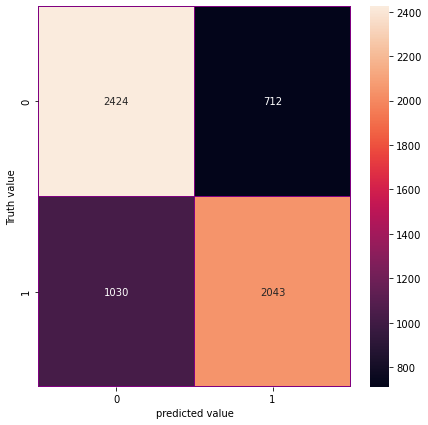

In [600]:
# Confusion Matrix 
cm = confusion_matrix(original, predicted)
plt.figure(figsize=(7,7))
sns.heatmap(cm, fmt='.0f', annot=True, linewidths=0.2, linecolor='purple')
plt.xlabel('predicted value')
plt.ylabel('Truth value')
plt.show()